In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas.api.types import is_numeric_dtype
import xarray as xr

,Cl,NO3,SO4,Na,NH4,C Orgánico,C Elemental,C Total,S,Cl.1,...,Pb,Hg,Pb.1,Zn.1,Mn.1,Mo,Ni.1,Ti.1,Sb,PM2.5
Cl,1.000000,0.315299,0.252617,0.483632,0.257069,0.484154,0.416998,0.311621,0.694145,0.348819,...,0.660872,-0.159237,0.561468,0.444537,0.168760,0.644574,0.128180,-0.067379,0.592082,0.505680
NO3,0.315299,1.000000,0.519026,-0.043653,0.827017,0.646242,0.236557,0.586673,0.768350,0.087045,...,0.208756,0.311826,0.177701,0.259176,-0.095151,0.498726,0.128953,-0.133708,0.352088,0.731775
SO4,0.252617,0.519026,1.000000,0.229512,0.544547,0.335937,0.451481,0.345783,0.895968,0.088725,...,0.419670,-0.503941,0.361241,0.467513,0.101477,0.626729,0.296642,-0.103088,0.423528,0.390068
Na,0.483632,-0.043653,0.229512,1.000000,-0.098322,0.221973,0.352322,0.080952,0.316098,0.540675,...,0.199842,-0.110646,0.152978,-0.043735,0.188581,0.219839,-0.004171,-0.162061,0.003051,0.204988
NH4,0.257069,0.827017,0.544547,-0.098322,1.000000,0.519808,0.251849,0.518635,0.725902,-0.011370,...,0.182501,0.027531,0.129442,0.300853,-0.045103,0.435671,0.157788,-0.001951,0.268718,0.643330
C Orgánico,0.484154,0.646242,0.335937,0.221973,0.519808,1.000000,0.493416,0.849326,0.515116,0.384627,...,0.619437,0.347944,0.558251,0.387484,0.277692,0.536540,0.082880,-0.114657,0.657414,0.883917
C Elemental,0.416998,0.236557,0.451481,0.352322,0.251849,0.493416,1.000000,0.407067,0.430872,0.140130,...,0.591016,-0.262914,0.581265,0.586221,0.221386,0.540262,0.309285,0.024665,0.463301,0.460768
C Total,0.311621,0.586673,0.345783,0.080952,0.518635,0.849326,0.407067,1.000000,0.408737,0.159487,...,0.206413,-0.224081,0.151734,0.172201,0.222526,0.255400,0.090197,0.067980,0.364808,0.801421
S,0.694145,0.768350,0.895968,0.316098,0.725902,0.515116,0.430872,0.408737,1.000000,0.175312,...,0.304558,-0.171221,0.198886,0.360417,0.100428,0.647573,0.164028,0.084394,0.294815,0.731114
Cl.1,0.348819,0.087045,0.088725,0.540675,-0.011370,0.384627,0.140130,0.159487,0.175312,1.000000,...,0.210104,-0.174459,0.211182,0.043266,0.271705,0.318668,-0.179982,0.107816,0.037151,0.385089


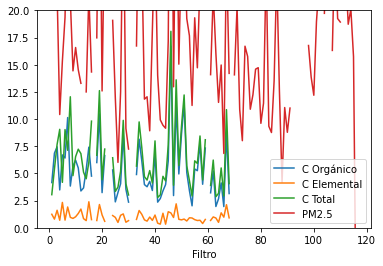

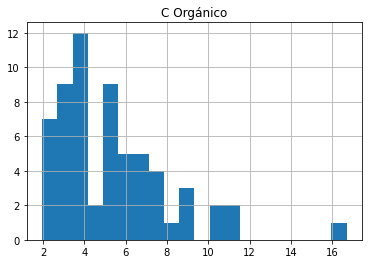

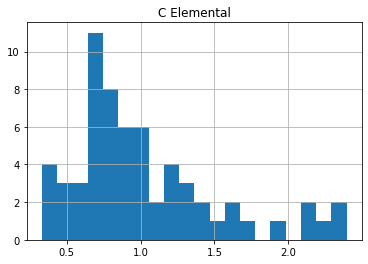

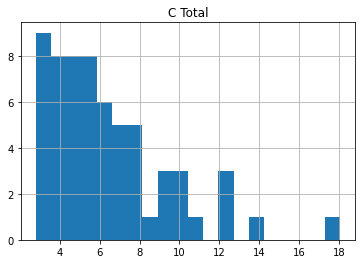

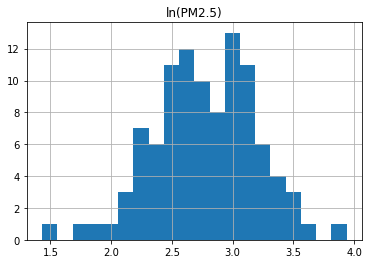

In [2]:
df = pd.read_csv('04122020_matriz_medidas_valores_apreciables.csv', index_col=0, skiprows=[1,2])
#df['PM2.5 (ug/m3)'] = df['PM2.5 (mg/m3)']*1000 * (df['PM2.5 (mg/m3)'] < 1) * (df['PM2.5 (mg/m3)'] > 0)

#display(df)
display(df.corr())
df.corr().to_csv('correlacion_todo.csv')

df.plot(y=['C Orgánico', 'C Elemental', 'C Total', 'PM2.5'], ylim=(0,20))
df.hist('C Orgánico', bins=20)
df.hist('C Elemental', bins=20)
df.hist('C Total', bins=20)
plt.show()
(np.log(df['PM2.5'].where(df['PM2.5']>1))).hist(bins=20)
plt.title('ln(PM2.5)')
plt.show()
#df.plot(y=['C Elemental (ug/cm2)'], xlim=(0,36), ylim=(0,0.75))

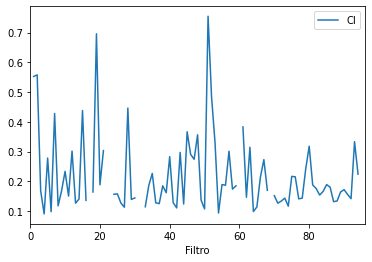

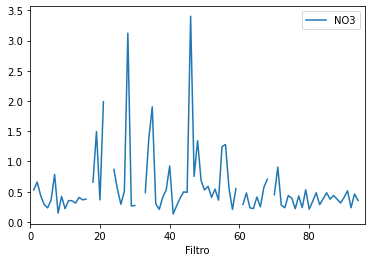

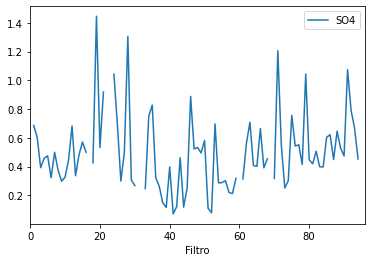

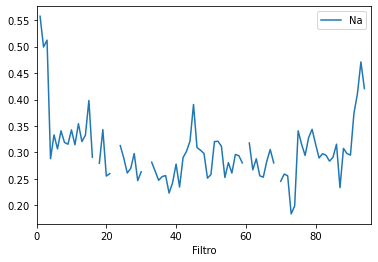

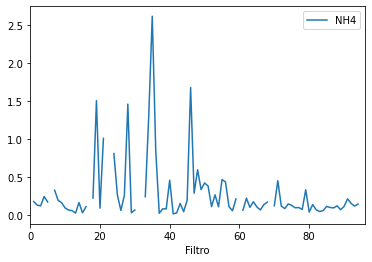

...

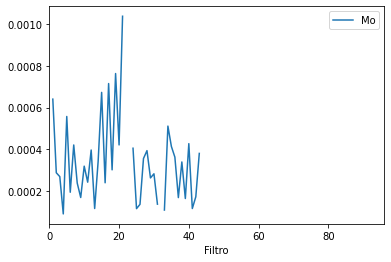

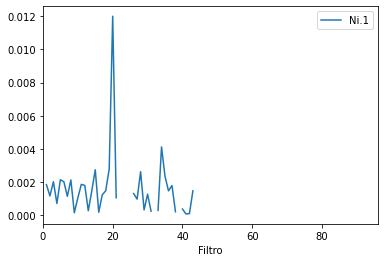

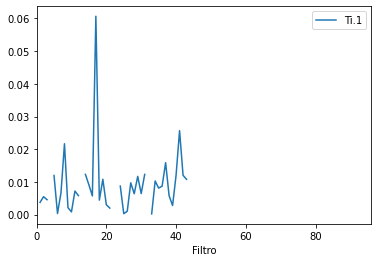

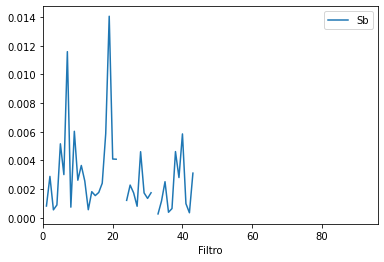

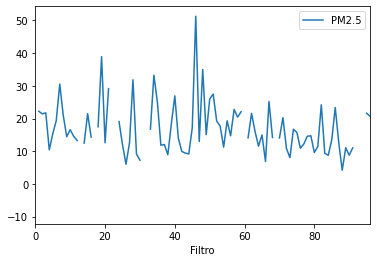

In [3]:
for i in df:
    if is_numeric_dtype(df[i]):
        #plt.figure(figsize=(20,10))
        df.plot(y=i, label=i, xlim=(0, 96))
        plt.show()

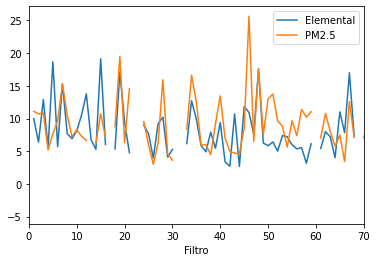

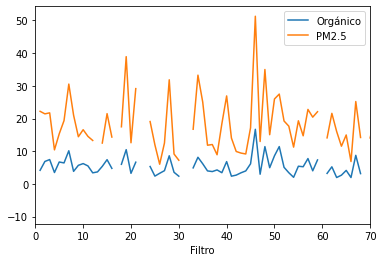

In [4]:
#df['C Orgánico'].plot(label='Orgánico')
(df['C Elemental'] * 8).plot(label='Elemental')
(df['PM2.5'] * 0.5).plot(label='PM2.5', xlim=(0,70))
plt.legend()
plt.show()
(df['C Orgánico']).plot(label='Orgánico')
(df['PM2.5']).plot(label='PM2.5', xlim=(0,70))
plt.legend()

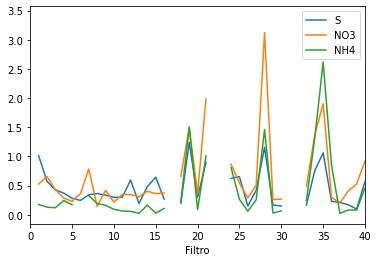

In [5]:
#(df['C Total'] *1.4 * 2.5).plot(label='Orgánico')
#(df['Na'] * 10).plot(label='Na')
(df['S']).plot(label='S', xlim=(0,40))
(df['NO3']).plot(label='NO3')
(df['NH4']).plot(label='NH4')
plt.legend()
plt.show()

In [6]:
#df.corr().where(df.corr() > 0.8).to_csv('correlacion_grande.csv')
df.corr().where(df.corr() > 0.65).where(df.corr() <= 0.8).to_csv('correlacion_grande.csv')

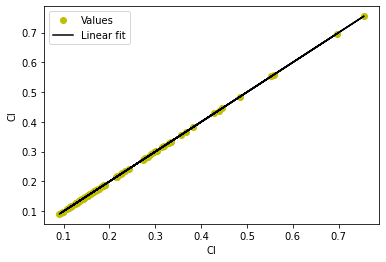

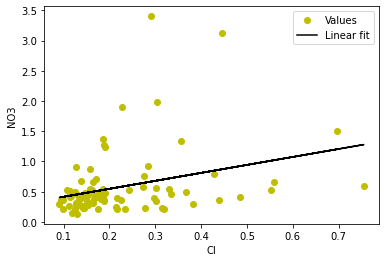

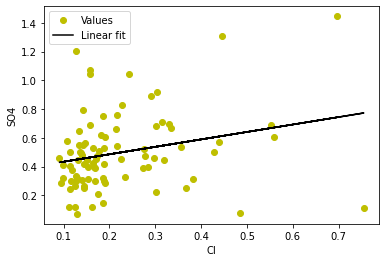

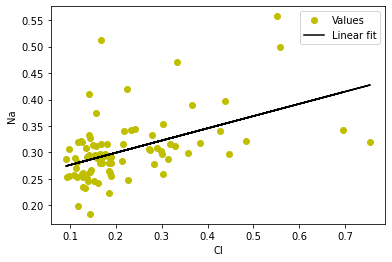

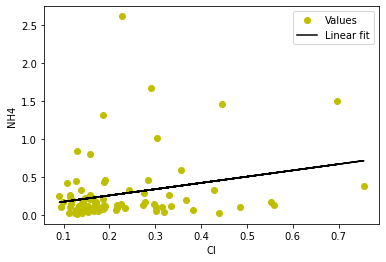

...

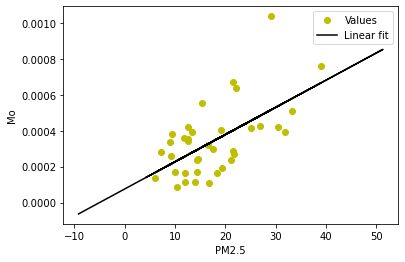

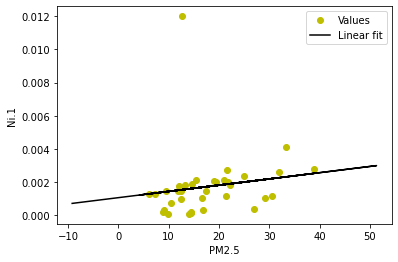

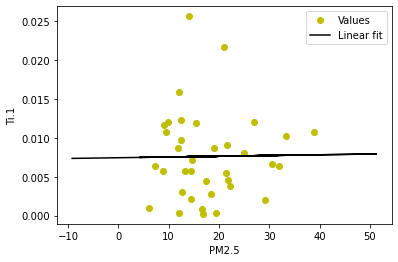

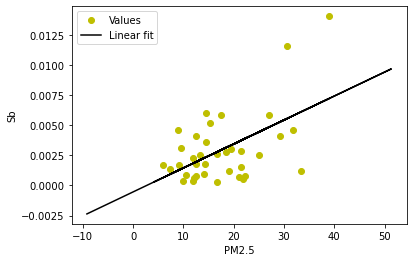

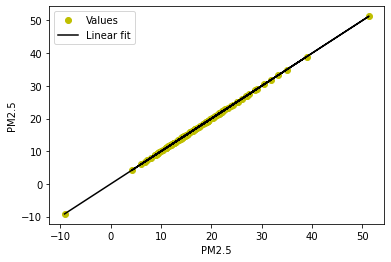

In [7]:
for i in df:
    if is_numeric_dtype(df[i]):
        for j in df:
            if is_numeric_dtype(df[j]):
                idx = np.isfinite(df[i]) & np.isfinite(df[j])
                coef = np.polyfit(df[i][idx],df[j][idx],1)
                poly1d_fn = np.poly1d(coef)
                correlation_fig = plt.plot(df[i],df[j], 'yo', df[i], poly1d_fn(df[i]), 'k')
                plt.legend(iter(correlation_fig), ('Values', 'Linear fit'))
                #plt.plot(df[i], df[i], 'r--')
                plt.xlabel(i)
                plt.ylabel(j)
                plt.show()